In [1]:
import ee
import requests
from io import BytesIO
from PIL import Image
import numpy as np

def mask_s2_clouds(image):
  qa = image.select('QA60')

  # Bits 10 and 11 are clouds and cirrus, respectively.
  cloud_bit_mask = 1 << 10
  cirrus_bit_mask = 1 << 11

  # Both flags should be set to zero, indicating clear conditions.
  mask = (
      qa.bitwiseAnd(cloud_bit_mask)
      .eq(0)
      .And(qa.bitwiseAnd(cirrus_bit_mask).eq(0))
  )

  return image.updateMask(mask).divide(10000)

#ee.Authenticate()
ee.Initialize(project='flowers-spaceapps')

lat, lon = 34.738262, -118.388363
center = ee.Geometry.Point(lon, lat)
region = center.buffer(3000).bounds()

class Dataset:
    @staticmethod
    def create_params(bands: list):
        return {
            'region': region,
            'dimensions': (512, 512),
            'format': 'png',
            'min': 0.0,
            'max': 0.3,
            'bands': bands,
            'crs': 'EPSG:4326',
        }
    
    @classmethod
    def create_dataset(cls, date_start: str, date_end: str, output_params: dict):
        return cls(
            (
                ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                .filterDate(date_start, date_end)
                # Pre-filter to get less cloudy granules.
                .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))
                .map(mask_s2_clouds)
            ),
            output_params
        )
    
    output_params_RGB = create_params(['B4', 'B3', 'B2'])
    output_params_NDVI = create_params(['B8', 'B4', 'B4'])
    
    def __init__(self, image_set: ee.ImageCollection, output_params: dict):
        self.image_set = image_set
        self.image_avg = image_set.mean()
        self.output_params = output_params
        self.url = None
        self.np_array = None
        self.output_image = None
    
    def get_url(self):
        if not self.url:
            self.url = self.image_avg.getThumbURL(self.output_params)
        return self.url
    
    def get_output_image(self):
        if not self.output_image:
            url = self.get_url()
            response = requests.get(url)
            response.raise_for_status()
            image = Image.open(BytesIO(response.content))
            self.output_image = image
        return self.output_image
    
    def get_array(self):
        if type(self.np_array) == type(None):
            self.np_array = np.array(self.get_output_image())
        return self.np_array

class Dataset_NVDI(Dataset):
    def __init__(self, image_set: ee.ImageCollection, output_params: dict):
        super(Dataset_NVDI, self).__init__(image_set, output_params)
        self.np_array_nvdi = None
        self.output_image_nvdi = None
    
    def get_output_image_nvdi(self):
        if not self.output_image_nvdi:
            self.calculate_nvdi()
        return self.output_image_nvdi
    
    def get_array_nvdi(self):
        if type(self.np_array_nvdi) == type(None):
            self.calculate_nvdi()
        return self.np_array_nvdi

    def calculate_nvdi(self):
        array = self.get_array()
        
        b8_matrix = array[:,:,0]
        b4_matrix = array[:,:,1]

        sum_matrix = b8_matrix + b4_matrix
        sum_matrix = np.where(sum_matrix == 0, 1, sum_matrix) # ensure not zero

        array_nvdi = (b8_matrix - b4_matrix) / sum_matrix
        array_nvdi += 1
        array_nvdi *= 255/2

        self.np_array_nvdi = array_nvdi
        self.output_image_nvdi = Image.fromarray(array_nvdi).convert('RGB')
        return self


In [7]:
nvdi_arrays = {}
rgb_arrays = {}

import datetime

# from 2019-01 to 2023-12
start_date = datetime.date(2019, 1, 1)
end_date = datetime.date(2023, 12, 1)

current_date = start_date

while current_date <= end_date:
    month = current_date.month
    year = current_date.year
    
    first_day = datetime.date(year, month, 1)
    last_day = datetime.date(year, month + 1, 1) - datetime.timedelta(days=1) if month < 12 else datetime.date(year, 12, 31)
    print(f'Processing {year}-{month:0>2} from {first_day} to {last_day}')
    index = f'{year}-{month:0>2}'
    nvdi_arrays[index] = Dataset_NVDI.create_dataset(first_day.strftime('%Y-%m-%d'), last_day.strftime('%Y-%m-%d'), Dataset.output_params_NDVI).get_array_nvdi()
    rgb_arrays[index] = Dataset.create_dataset(first_day.strftime('%Y-%m-%d'), last_day.strftime('%Y-%m-%d'), Dataset.output_params_RGB).get_array()

    current_date = last_day + datetime.timedelta(days=1)

Processing 2019-01 from 2019-01-01 to 2019-01-31
Processing 2019-02 from 2019-02-01 to 2019-02-28
Processing 2019-03 from 2019-03-01 to 2019-03-31
Processing 2019-04 from 2019-04-01 to 2019-04-30
Processing 2019-05 from 2019-05-01 to 2019-05-31
Processing 2019-06 from 2019-06-01 to 2019-06-30
Processing 2019-07 from 2019-07-01 to 2019-07-31
Processing 2019-08 from 2019-08-01 to 2019-08-31
Processing 2019-09 from 2019-09-01 to 2019-09-30
Processing 2019-10 from 2019-10-01 to 2019-10-31
Processing 2019-11 from 2019-11-01 to 2019-11-30
Processing 2019-12 from 2019-12-01 to 2019-12-31
Processing 2020-01 from 2020-01-01 to 2020-01-31
Processing 2020-02 from 2020-02-01 to 2020-02-29
Processing 2020-03 from 2020-03-01 to 2020-03-31
Processing 2020-04 from 2020-04-01 to 2020-04-30
Processing 2020-05 from 2020-05-01 to 2020-05-31
Processing 2020-06 from 2020-06-01 to 2020-06-30
Processing 2020-07 from 2020-07-01 to 2020-07-31
Processing 2020-08 from 2020-08-01 to 2020-08-31
Processing 2020-09 f

2019-01
RGB
NDVI
Masked


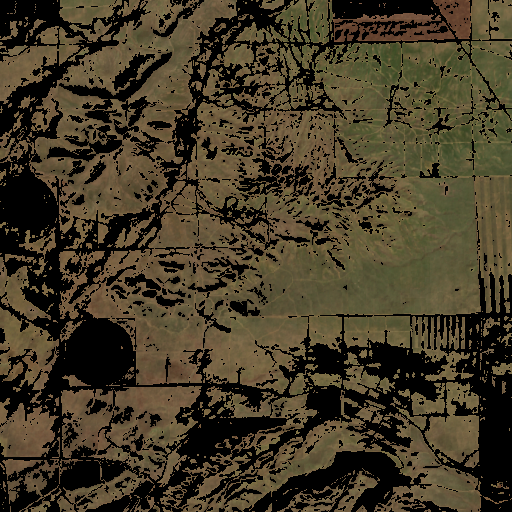

2019-02
RGB
NDVI
Masked


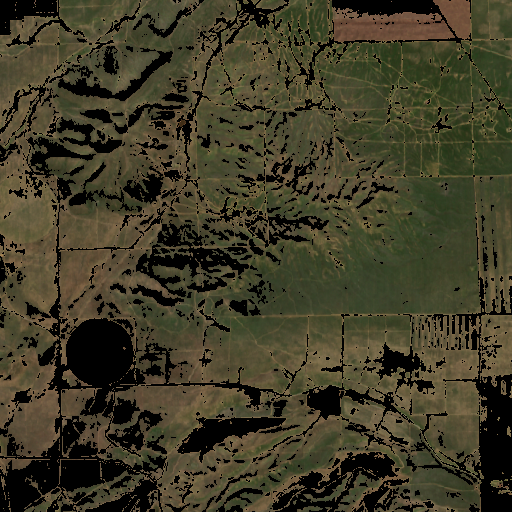

2019-03
RGB
NDVI
Masked


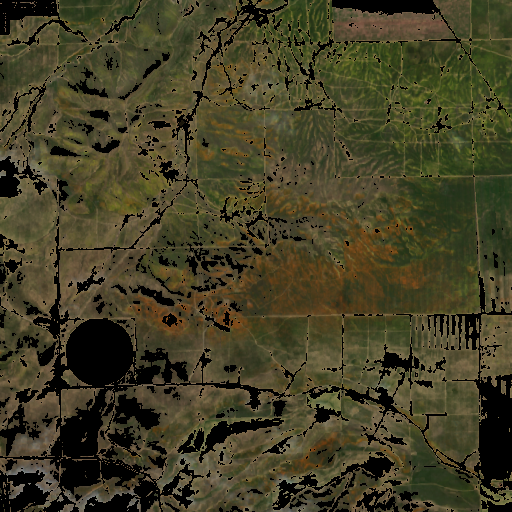

2019-04
RGB
NDVI
Masked


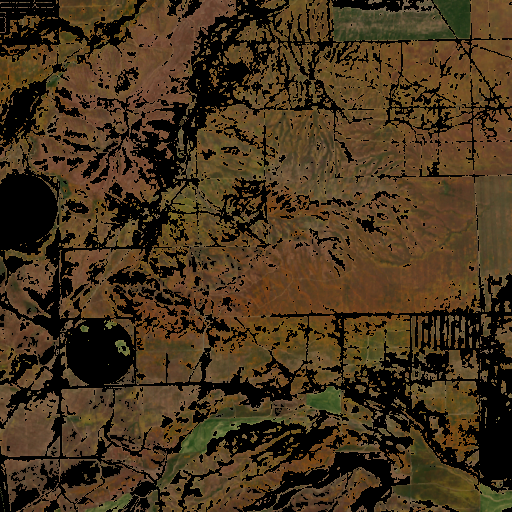

2019-05
RGB
NDVI
Masked


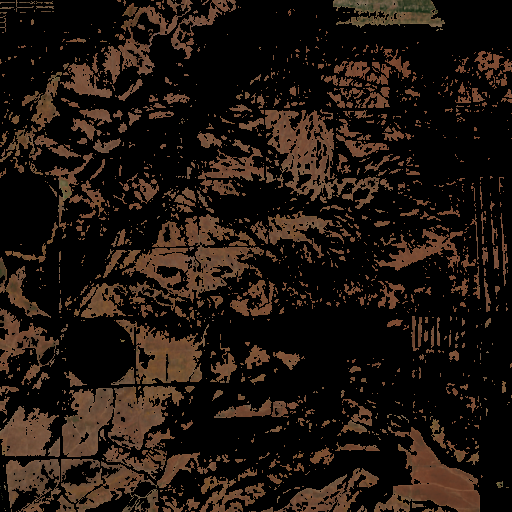

2019-06
RGB
NDVI
Masked


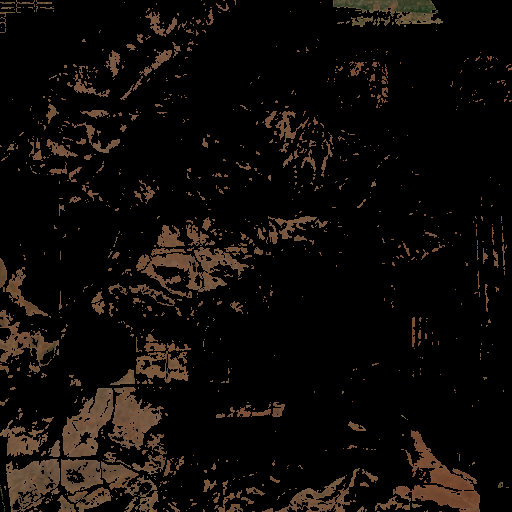

2019-07
RGB
NDVI
Masked


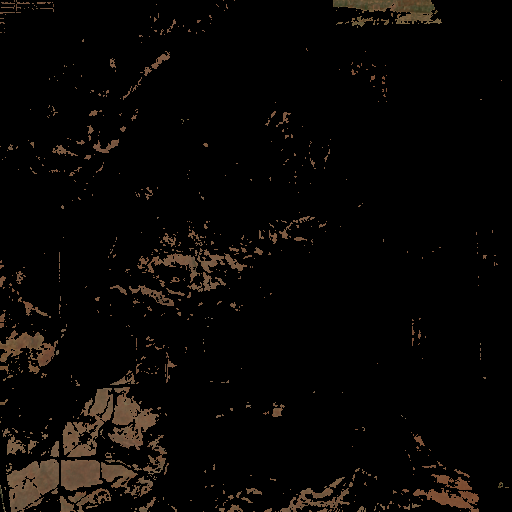

2019-08
RGB
NDVI
Masked


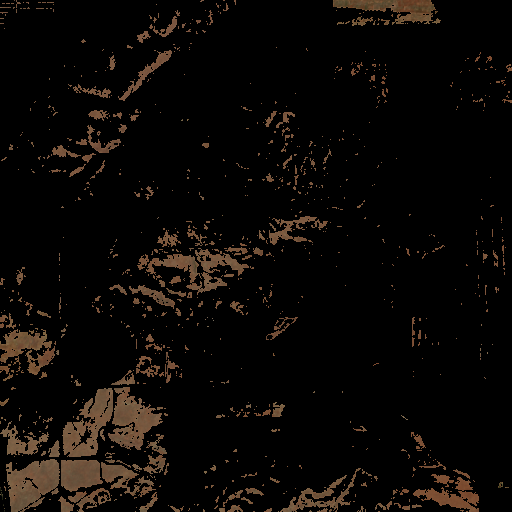

2019-09
RGB
NDVI
Masked


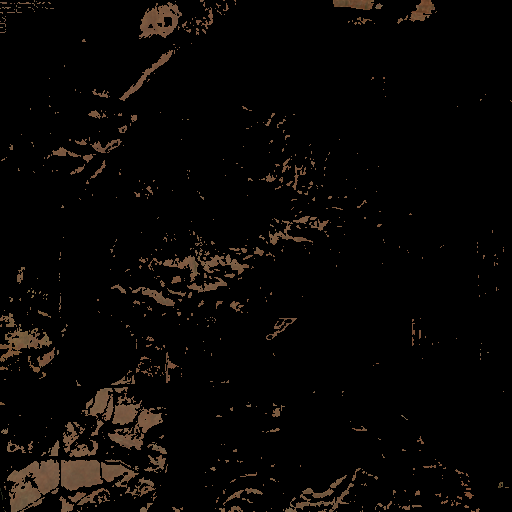

2019-10
RGB
NDVI
Masked


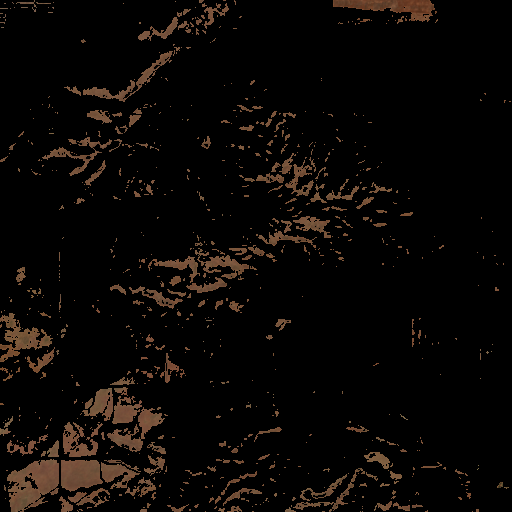

2019-11
RGB
NDVI
Masked


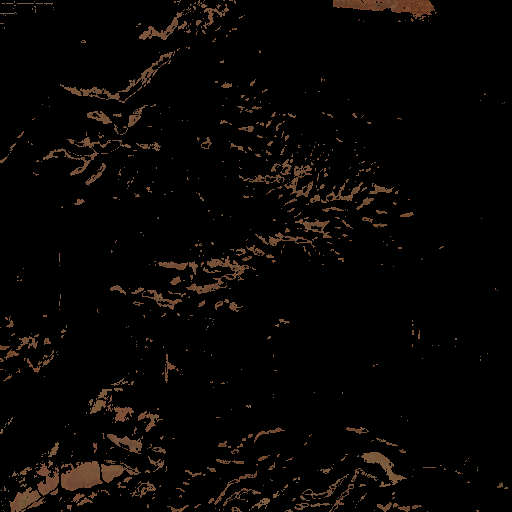

2019-12
Skipping month with null data
2020-01
RGB
NDVI
Masked


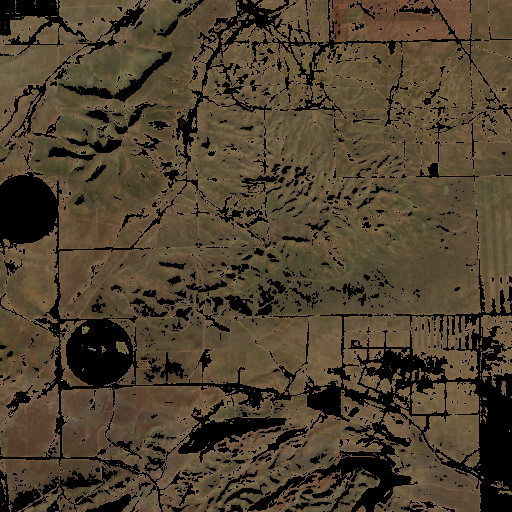

2020-02
RGB
NDVI
Masked


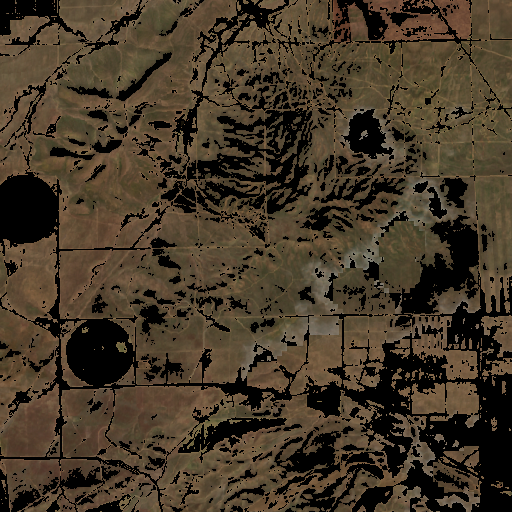

2020-03
Skipping month with null data
2020-04
RGB
NDVI
Masked


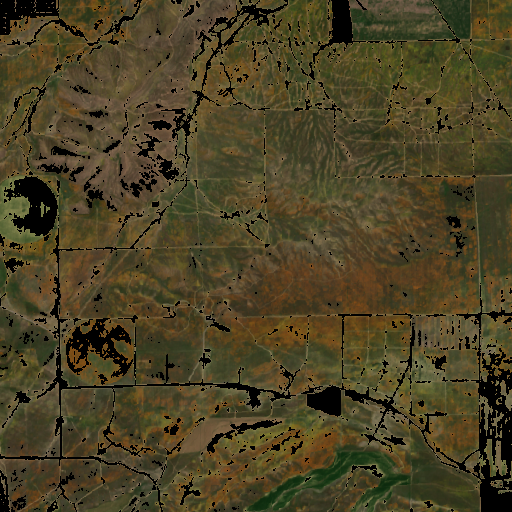

2020-05
RGB
NDVI
Masked


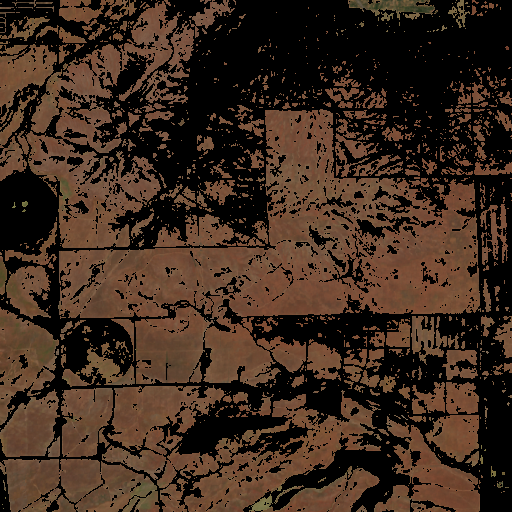

2020-06
RGB
NDVI
Masked


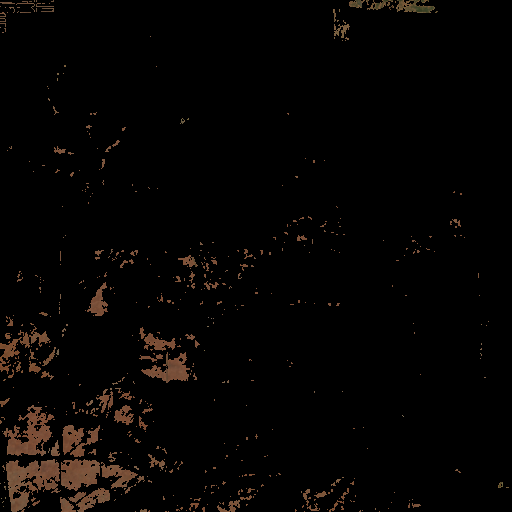

2020-07
RGB
NDVI
Masked


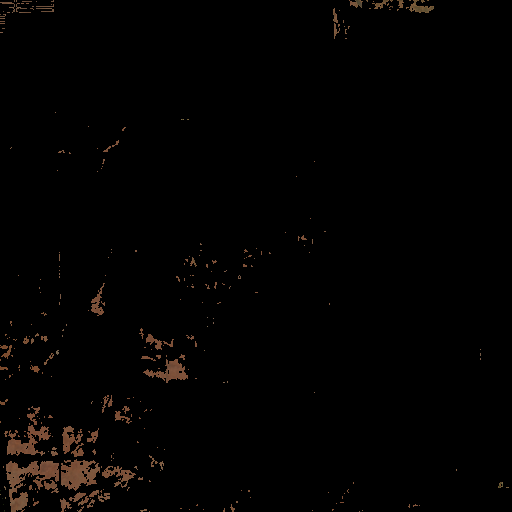

2020-08
RGB
NDVI
Masked


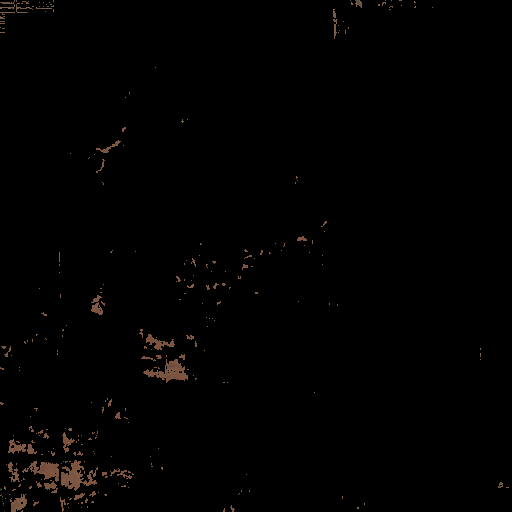

2020-09
RGB
NDVI
Masked


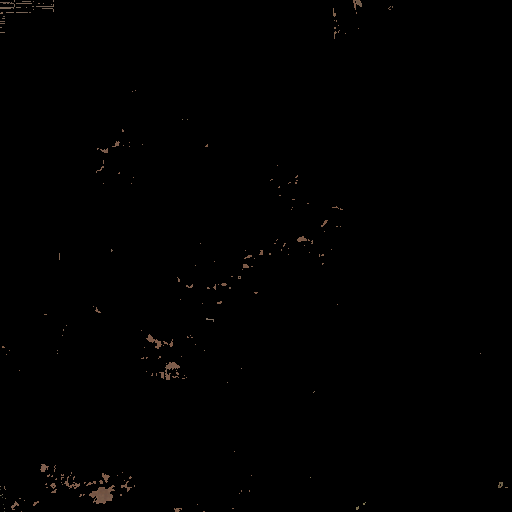

2020-10
RGB
NDVI
Masked


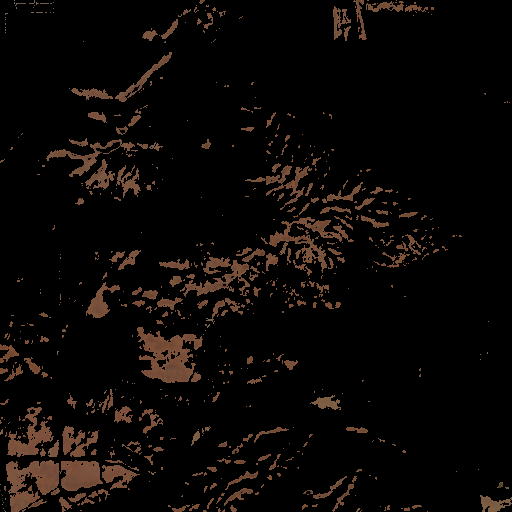

2020-11
RGB
NDVI
Masked


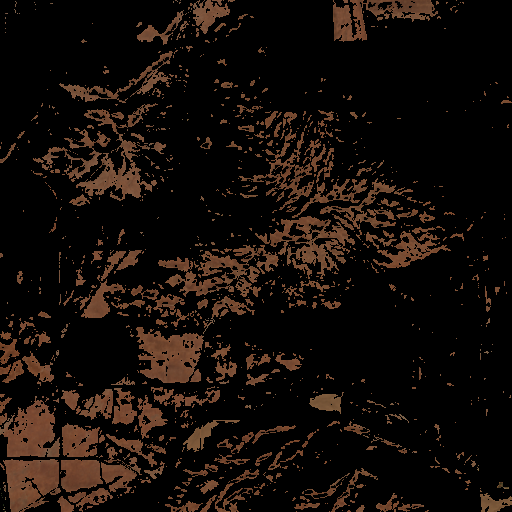

2020-12
RGB
NDVI
Masked


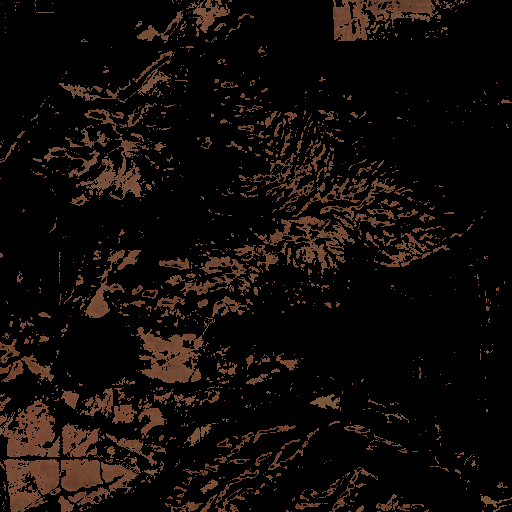

2021-01
RGB
NDVI
Masked


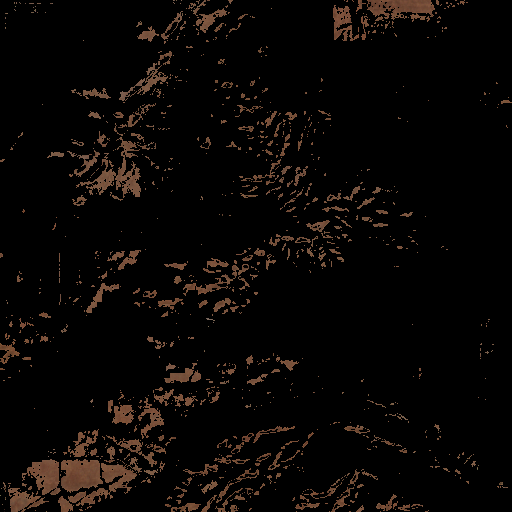

2021-02
RGB
NDVI
Masked


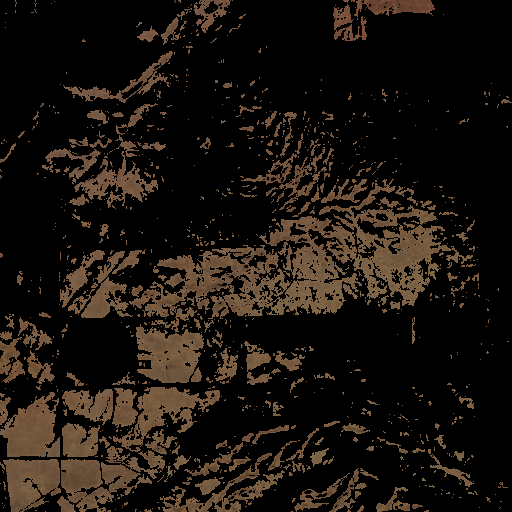

2021-03
RGB
NDVI
Masked


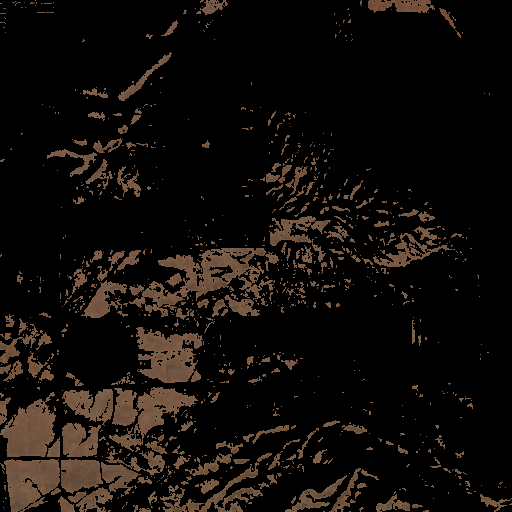

2021-04
RGB
NDVI
Masked


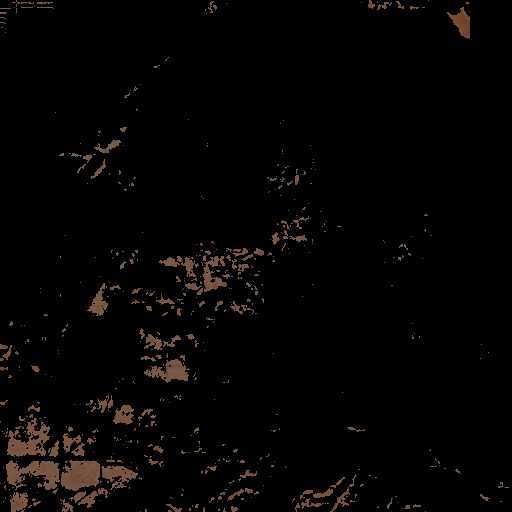

2021-05
RGB
NDVI
Masked


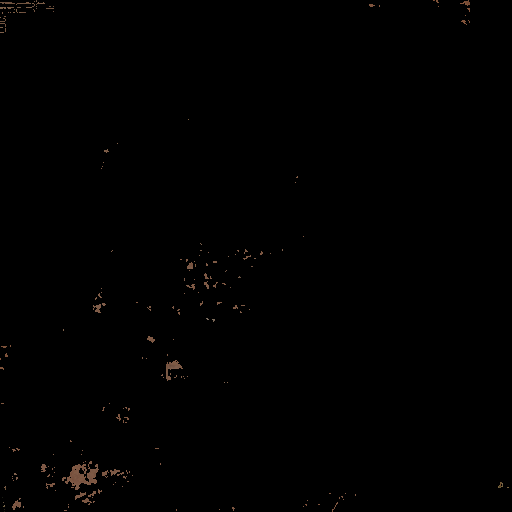

2021-06
RGB
NDVI
Masked


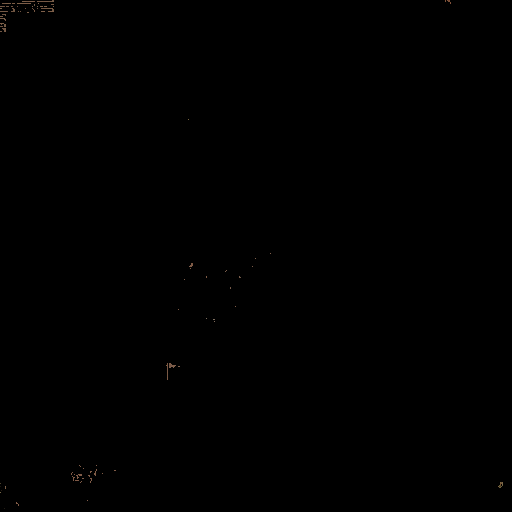

2021-07
RGB
NDVI
Masked


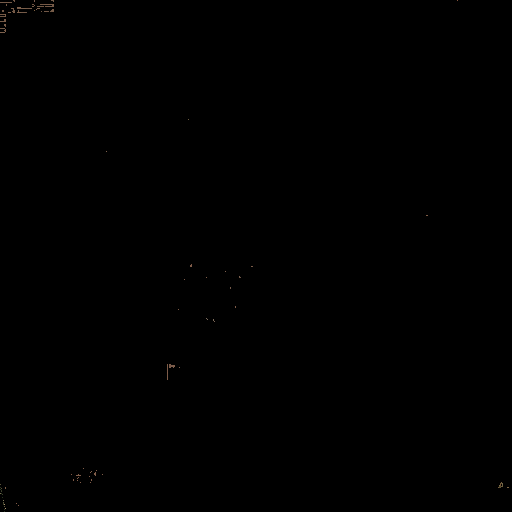

2021-08
RGB
NDVI
Masked


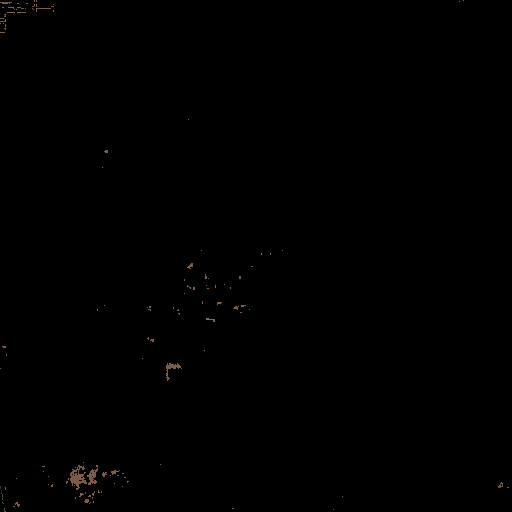

2021-09
RGB
NDVI
Masked


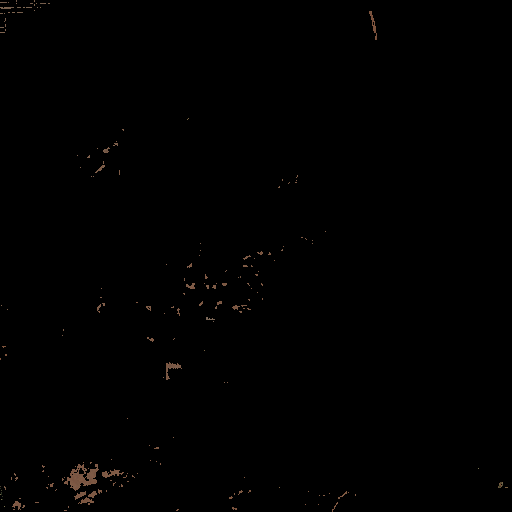

2021-10
RGB
NDVI
Masked


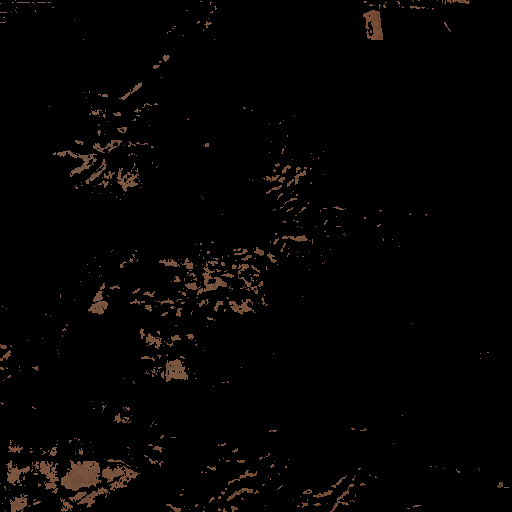

2021-11
RGB
NDVI
Masked


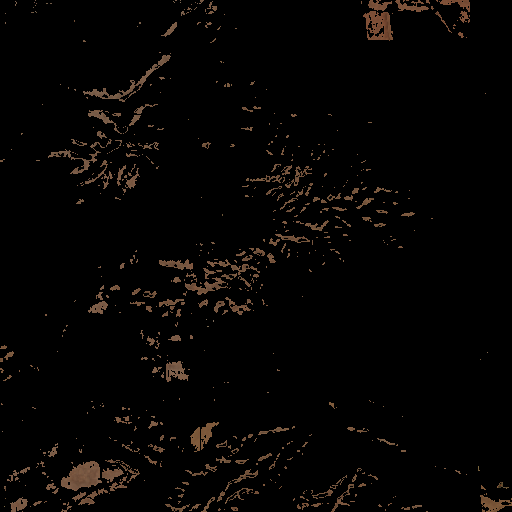

2021-12
RGB
NDVI
Masked


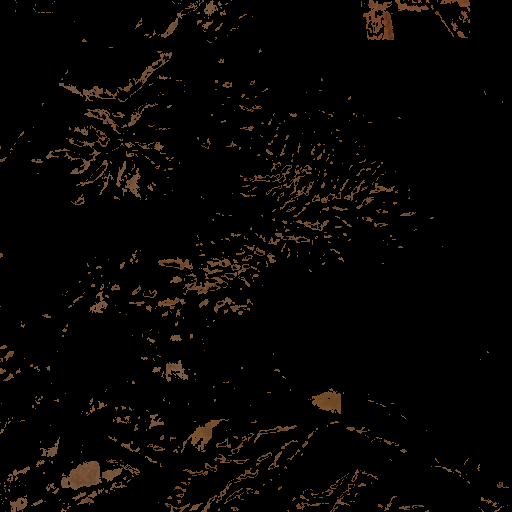

2022-01
RGB
NDVI
Masked


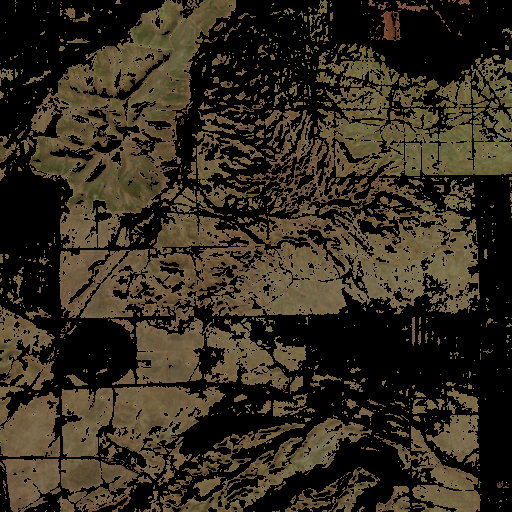

2022-02
RGB
NDVI
Masked


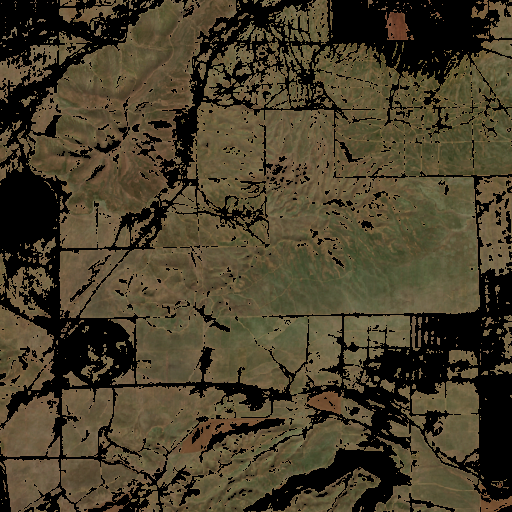

2022-03
RGB
NDVI
Masked


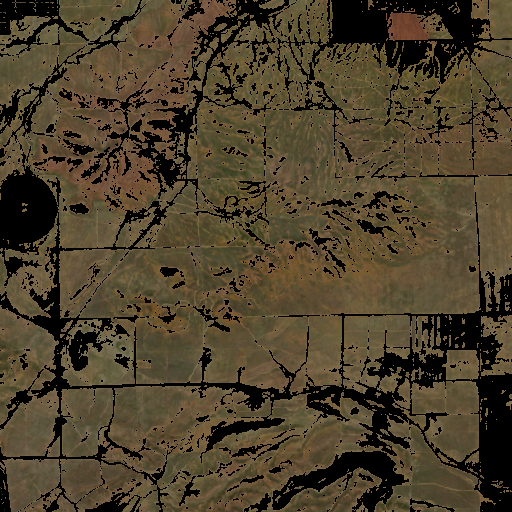

2022-04
RGB
NDVI
Masked


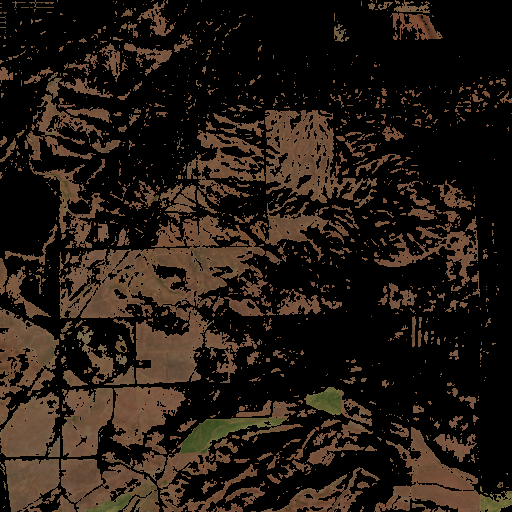

2022-05
RGB
NDVI
Masked


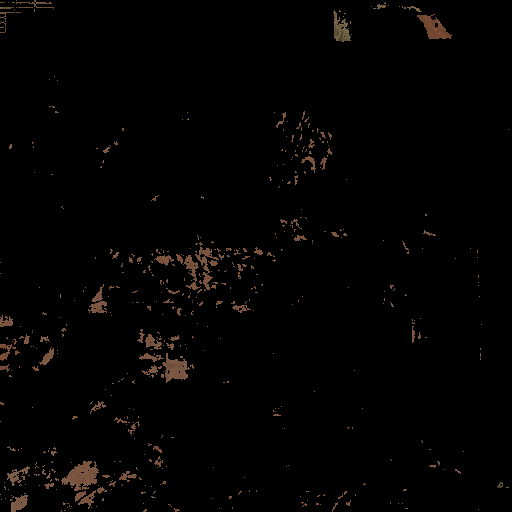

2022-06
RGB
NDVI
Masked


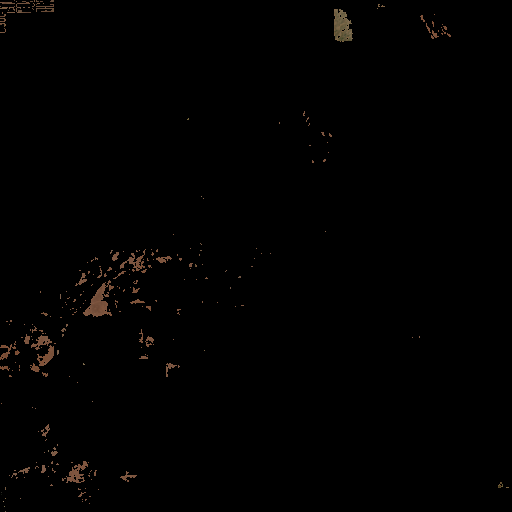

2022-07
RGB
NDVI
Masked


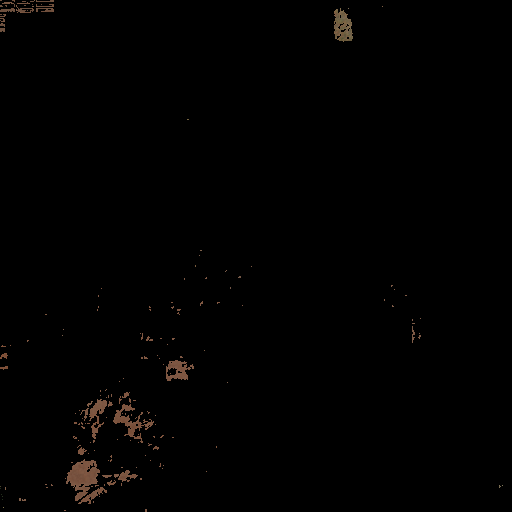

2022-08
RGB
NDVI
Masked


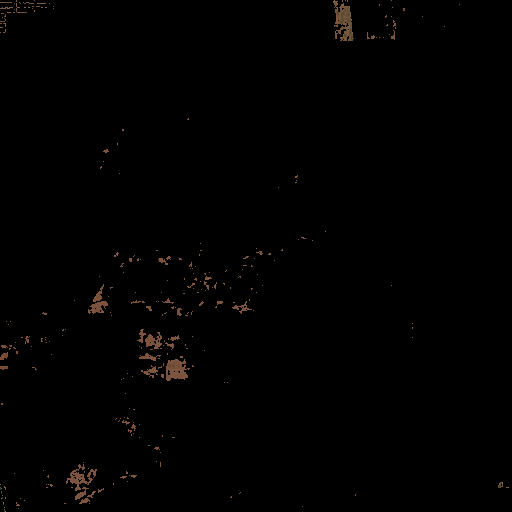

2022-09
RGB
NDVI
Masked


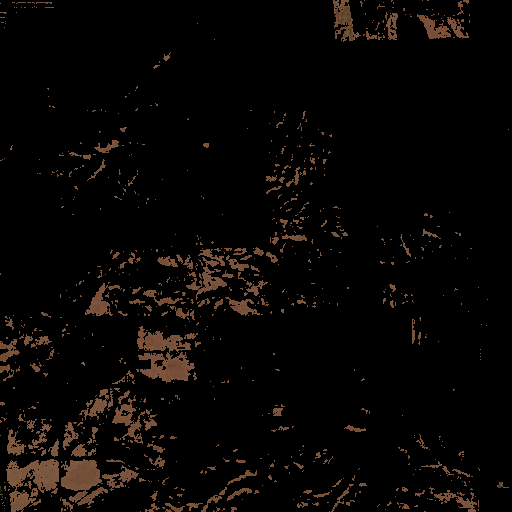

2022-10
RGB
NDVI
Masked


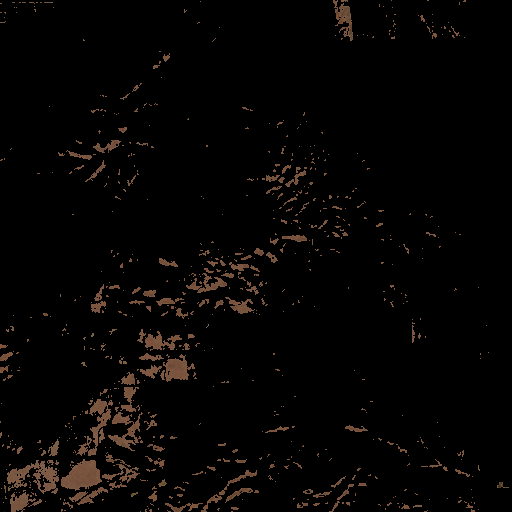

2022-11
RGB
NDVI
Masked


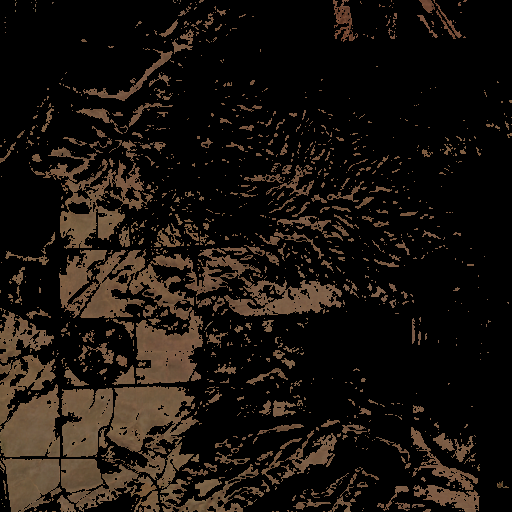

2022-12
RGB
NDVI
Masked


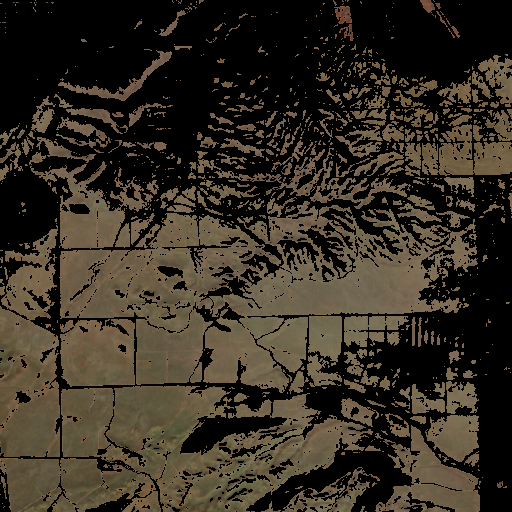

2023-01
RGB
NDVI
Masked


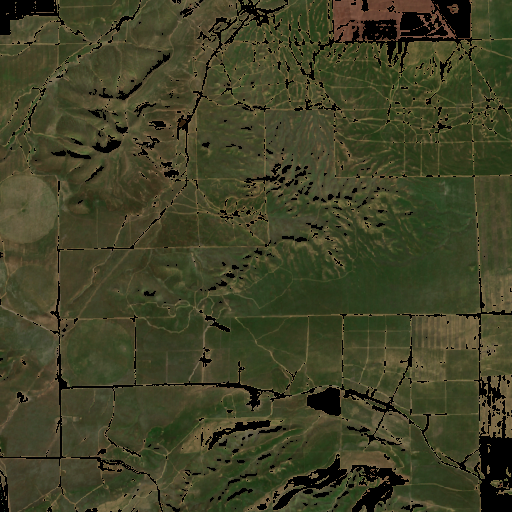

2023-02
RGB
NDVI
Masked


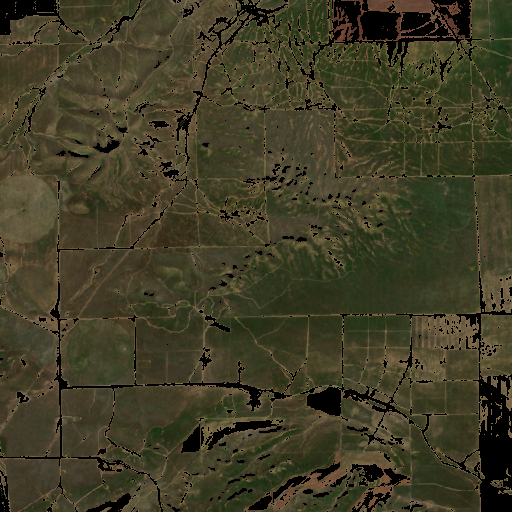

2023-03
RGB
NDVI
Masked


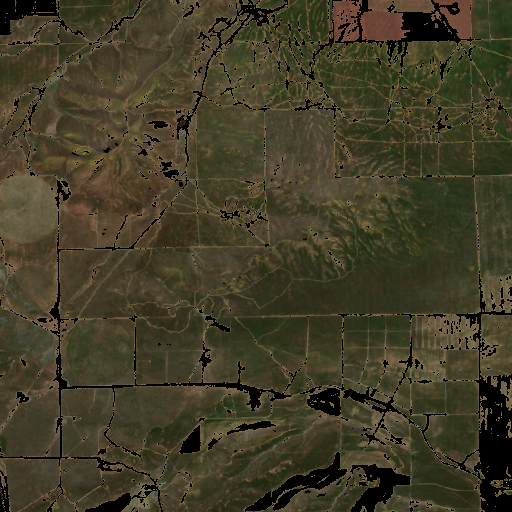

2023-04
RGB
NDVI
Masked


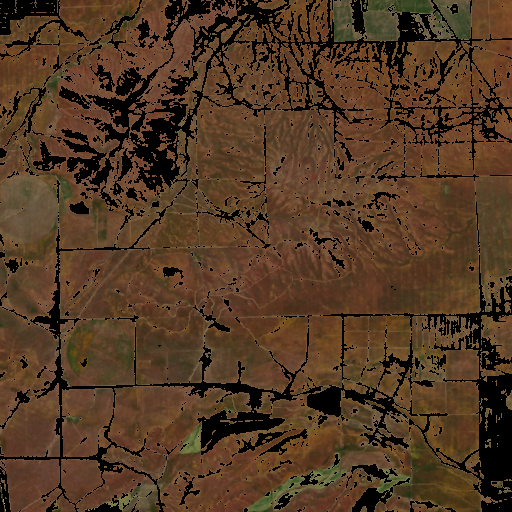

2023-05
RGB
NDVI
Masked


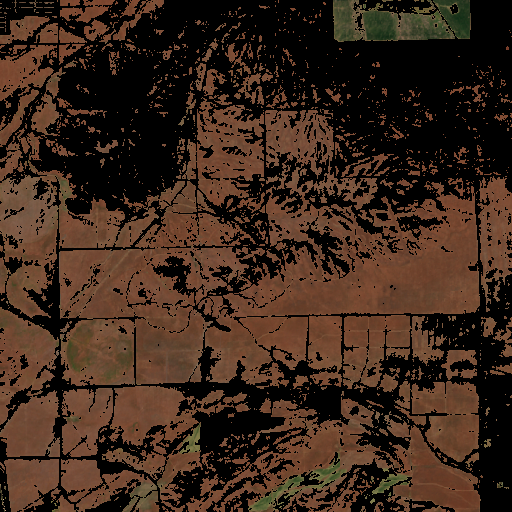

2023-06
RGB
NDVI
Masked


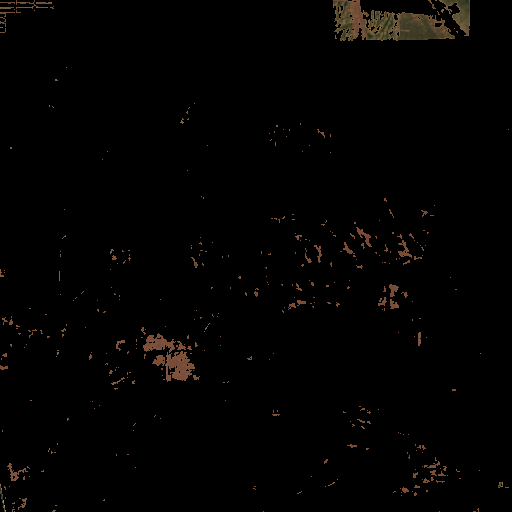

2023-07
RGB
NDVI
Masked


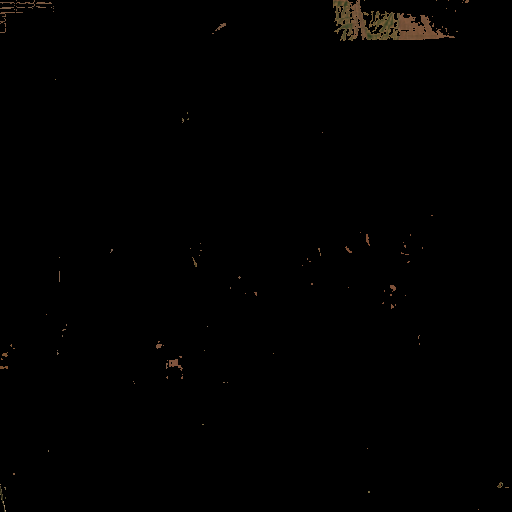

2023-08
RGB
NDVI
Masked


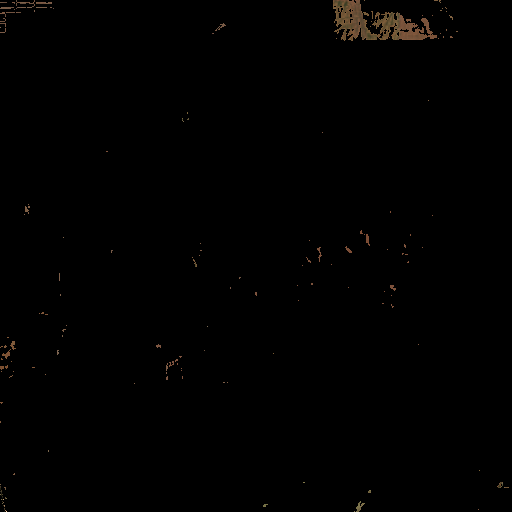

2023-09
RGB
NDVI
Masked


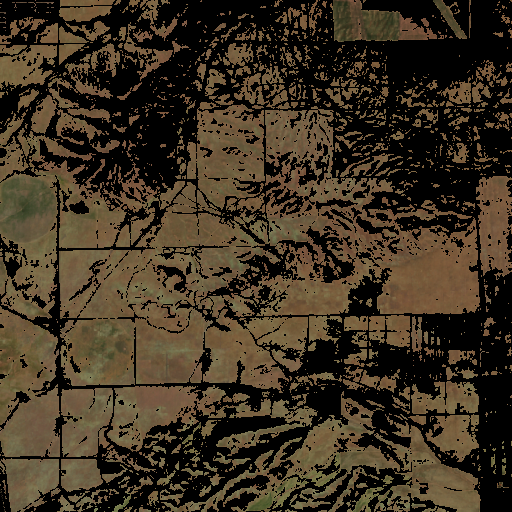

2023-10
RGB
NDVI
Masked


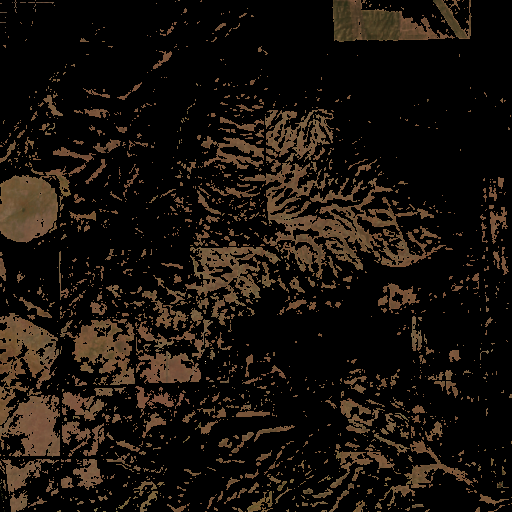

2023-11
RGB
NDVI
Masked


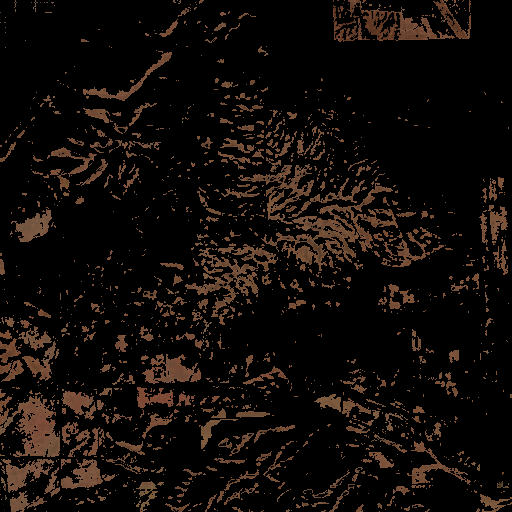

2023-12
RGB
NDVI
Masked


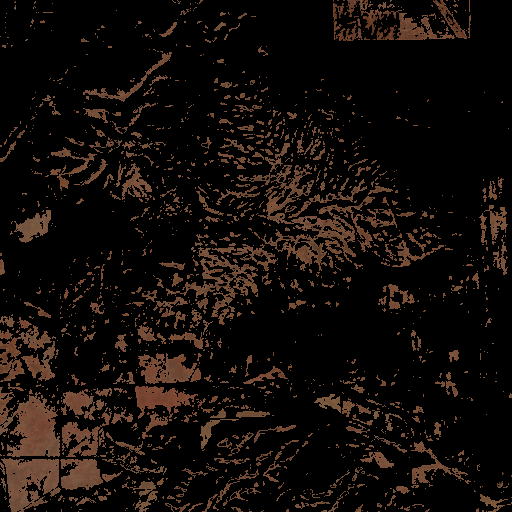

In [10]:
monthly_data_difference = {}

for date in nvdi_arrays.keys():
    print(date)
    nvdi_array = nvdi_arrays[date]
    rgb_array = rgb_arrays[date]

    if rgb_array.shape[2] == 4:
        print(f'Skipping month with null data')
        continue
    
    nvdi_array = np.stack((nvdi_array,)*3, axis=-1)
    monthly_data_difference[date] = np.where(nvdi_array < 250, 0, rgb_array)
    
    print('RGB')
    image = Image.fromarray(rgb_array).convert('RGB')
    # save to file
    image.save(f'images/{date}_rgb.png')

    print('NDVI')
    image = Image.fromarray(nvdi_array[:,:,0]).convert('RGB')
    image.save(f'images/{date}_nvdi.png')

    print('Masked')
    image = Image.fromarray(monthly_data_difference[date]).convert('RGB')
    image.save(f'images/{date}_masked.png')
    display(image)